## A simple mortgage calculator.

The idea is to get a quick understanding of the interest rates involved, principal to be payed at every step etc.

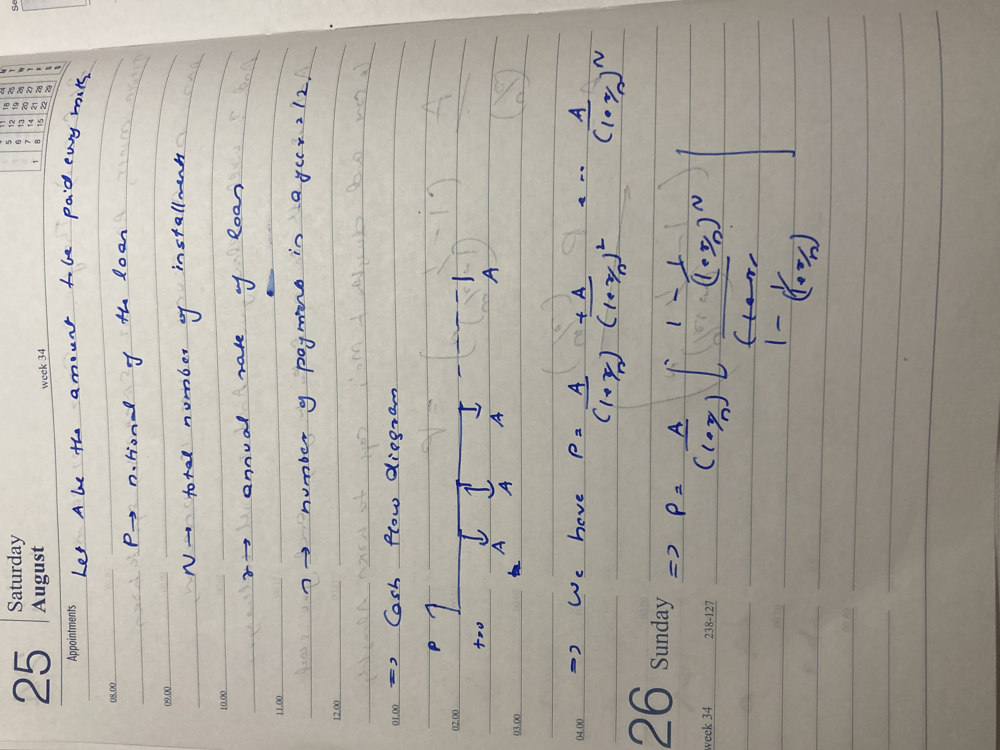

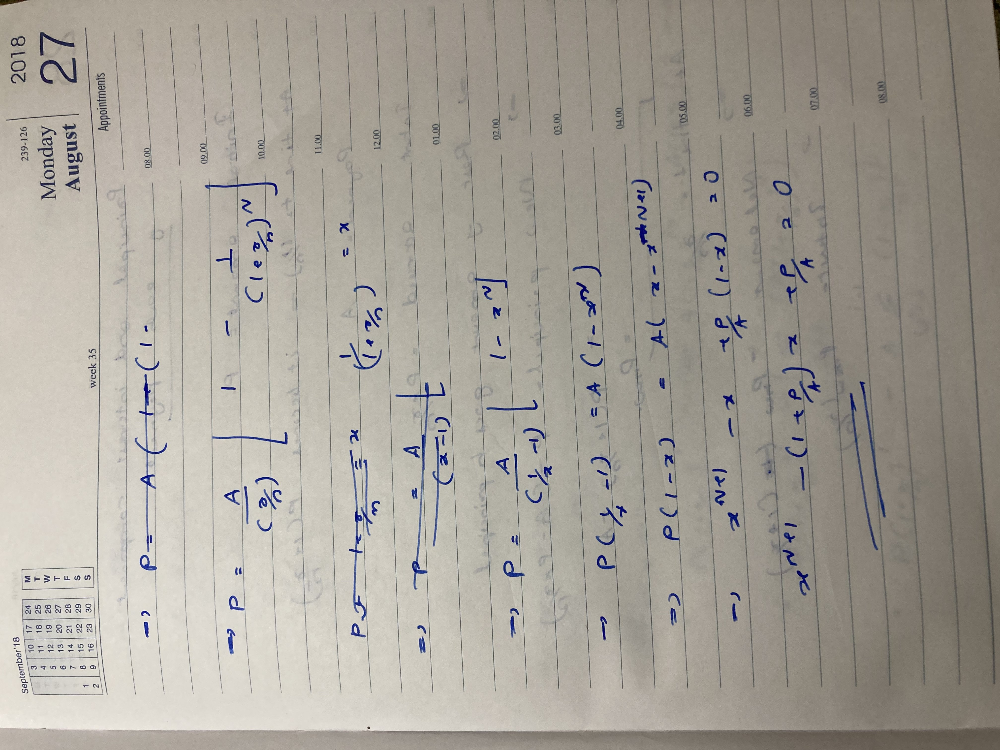

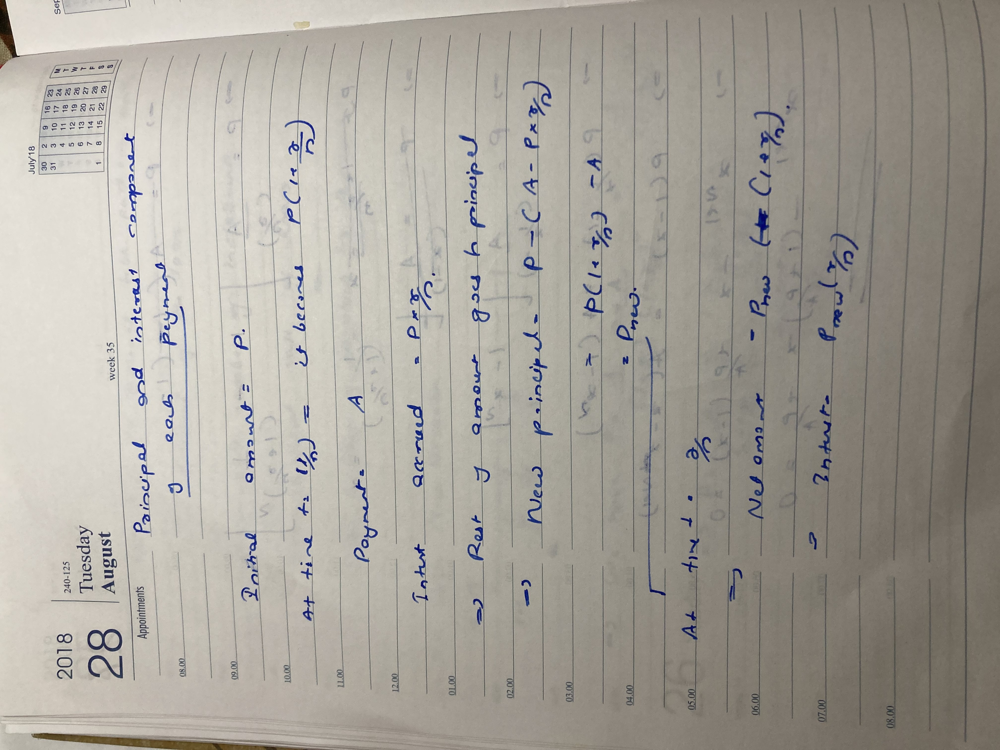

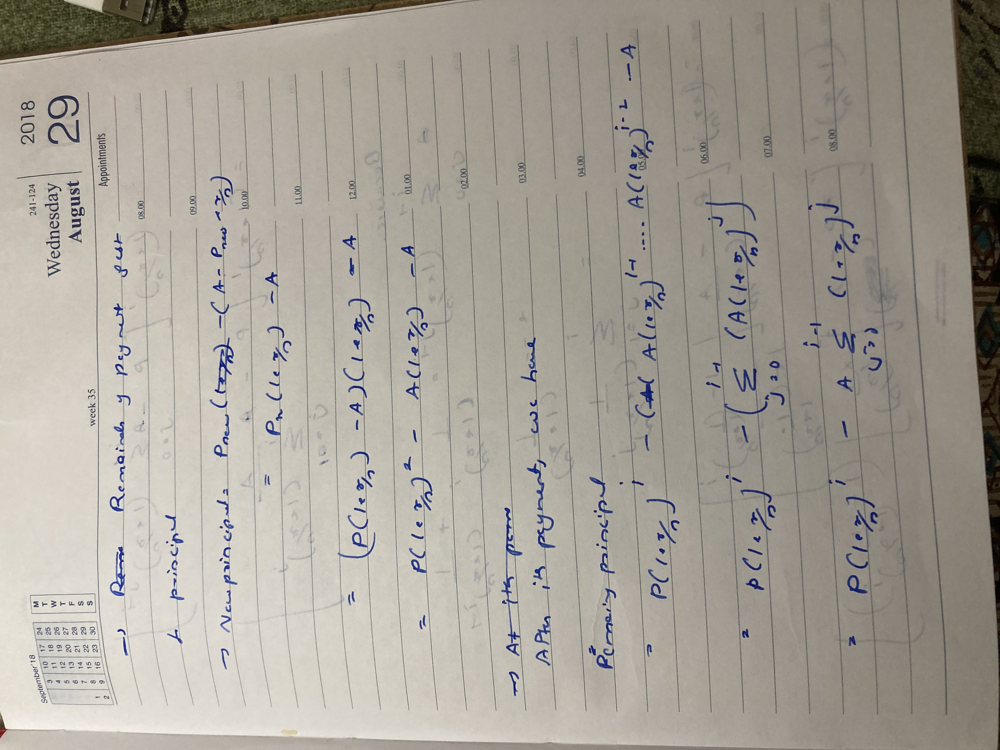

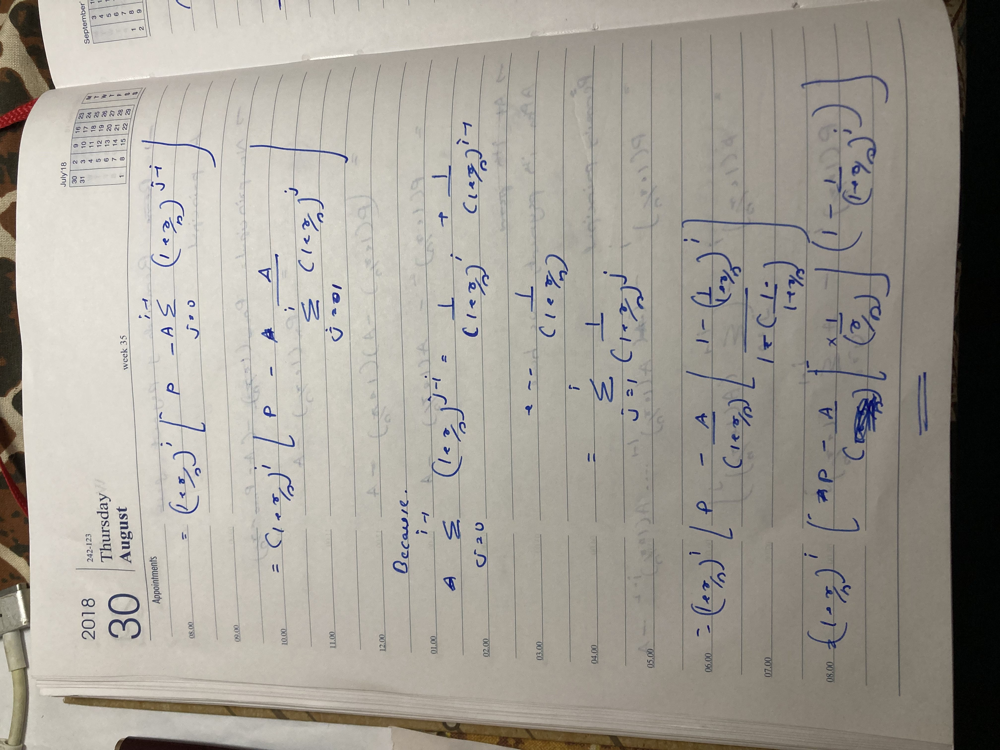

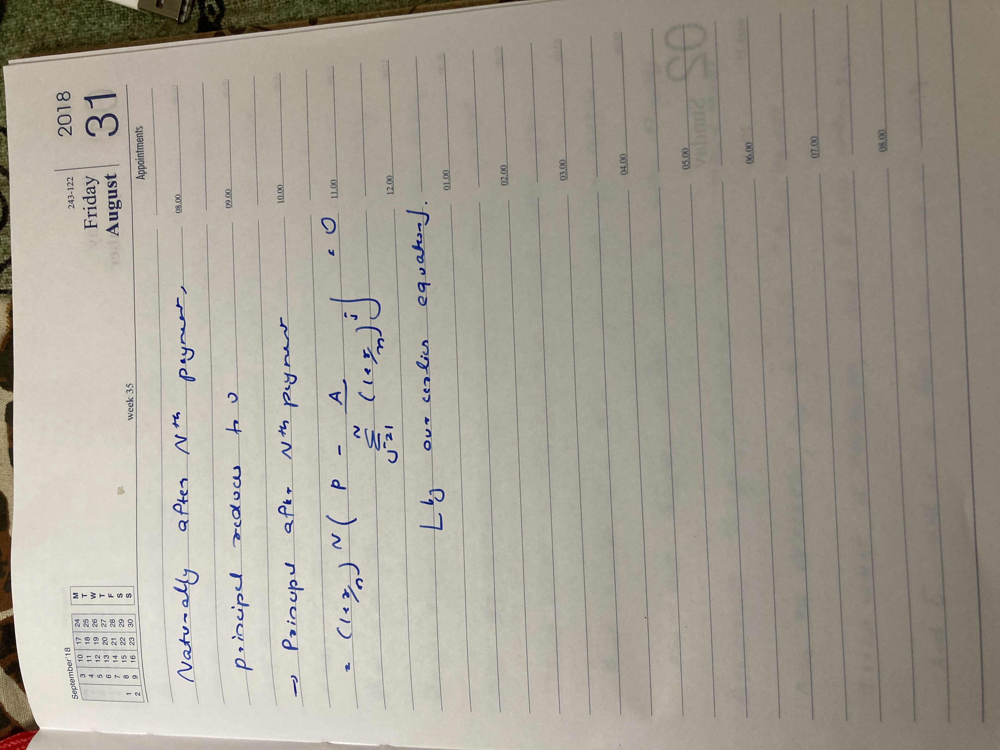

### Find annual interest rate given other parameters

In [277]:
import numpy as np
from numpy.testing import assert_almost_equal


In [278]:
def get_corr_coeff_array(P, A, N):
    coeff = np.zeros(N+2)
    coeff[0] = 1
    coeff[N] = -P/A - 1
    coeff[N+1] = P/A
    return coeff

def get_annualized_rate(coeff, n=12):
    roots = np.roots(coeff)
    real_roots = [root for root in roots if root.imag ==0 ]
    valid_real_roots = [real_root for real_root in real_roots if real_root > 0 and not np.allclose(real_root,1)]

    rate = ((1/valid_real_roots[0].real) - 1)*n   
    return rate

In [279]:
# TEST cases
TEST_A = 1000
TEST_N = 24
TEST_r = 0.12
TEST_n = 12
factor = 1/(1 + TEST_r/TEST_n)
TEST_P = (TEST_A*factor)*(1 - factor**TEST_N)/(1 - factor)
coeff = get_corr_coeff_array(TEST_P, TEST_A, TEST_N)

assert_almost_equal(get_annualized_rate(coeff, TEST_n), TEST_r)

In [280]:
# Notional of loan.
P = 7500000

# Number of installments
N = 7*12

# Monthly amount to be paid.
A = 70000

In [281]:
get_annualized_rate(get_corr_coeff_array(P, A, N))

0.11713716460762846

### Find monthly amount given other parameters

In [282]:
def get_period_payment_amount(P, r, N, n=12):
    A = P*(r/n)/((1 - (1/(1 + r/n)**N)))
    return A

In [283]:
assert_almost_equal(TEST_A, get_period_payment_amount(TEST_P, TEST_r, TEST_N, TEST_n))

In [292]:
# Notional of loan.
P = 7500000

# Number of installments
N = 15*12

# Yearly interest rate, which is to be compounded annually.
r = 0.08

# Number of payments in a year.
n=12

In [293]:
A = get_period_payment_amount(P, r, N, n)

In [294]:
A

71673.90632477675

### Find principal after every mortage payment.

In [287]:
def get_principal_after_ith_payment(P, A, r, i, N, n=12):
    assert(i <= N)
    factor = (1 + r/n)
    power_factor = factor ** i
    new_principal = power_factor*(P - A*((1/(factor-1))*(1 - (1/power_factor))))
    return new_principal

In [288]:
def get_principal_after_ith_payment_iterative(P, A, r, i, N, n=12):
    assert(i <= N)
    prev_principal = P
    for j in range(1,i+1):
        principal_cur = prev_principal * (1 + r/n) - A
        prev_principal = principal_cur
    return principal_cur

In [289]:
assert_almost_equal(get_principal_after_ith_payment(TEST_P, TEST_A, TEST_r, 3, TEST_N, n=12), 
                    get_principal_after_ith_payment_iterative(TEST_P, TEST_A, TEST_r, 3, TEST_N, n=12))

In [290]:
def display_principal_after_each_payment(P, A, r, N, n=12):
    prev_principal = P
    for i in range(1,N+1):
        principal_cur = prev_principal * (1 + r/n) - A
        prev_principal = principal_cur
        print(i, principal_cur)        


In [291]:
display_principal_after_each_payment(P, A, r, N )

1 7996064.996759033
2 7992098.841409074
3 7988101.287329262
4 7984072.085946318
5 7980010.986719091
6 7975917.737122984
7 7971792.082634239
8 7967633.766714126
9 7963442.530792979
10 7959218.114254122
11 7954960.254417666
12 7950668.686524171
13 7946343.143718187
14 7941983.357031655
15 7937589.055367188
16 7933159.9654812105
17 7928695.811966969
18 7924196.317237406
19 7919661.201507901
20 7915090.182778871
21 7910482.976818236
22 7905839.297143745
23 7901158.855005166
24 7896441.359366322
25 7891686.5168870045
26 7886894.031904725
27 7882063.606416337
28 7877194.940059499
29 7872287.730094003
30 7867341.671382946
31 7862356.4563737605
32 7857331.7750790855
33 7852267.315057494
34 7847162.761394065
35 7842017.796680801
36 7836832.100996889
37 7831605.351888814
38 7826337.2243503
39 7821027.390802105
40 7815675.521071654
41 7810281.282372504
42 7804844.339283652
43 7799364.35372868
44 7793840.984954731
45 7788273.889511322
46 7782662.721228985
47 7777007.131197747
48 7771306.767745428


### Handling generic cash flows

Generic cash flows can be handled by structuring the coefficient array appropriately.

#### Exercise 1 : Coupon bond

An investment of P in an n-annual coupon bond with maturity T, yields payments of qP/n at times t=1/n,2/n,.... T(that is a total of N payments, where N = nT) , along with a payment of P at maturity, that is at time t=T. Evaluate the effective annual interest obtained with an investment in this security.

#### Exercise 2 : Home mortgage

A home loan taken for amount P, includes an initial downpayment of D, along with a payment of A1 in the first month, and payments of A in all the following months in the duration of the mortgage. Evaluate the effective interest rate borne by the borrower in this scenario.